In [1]:
### Set environment ###

import numpy as np
import pandas as pd
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
import scipy.optimize
import scipy.spatial
import glob
import time
start = time.time()

### Import multiple csv files into pandas and concatenate into one DataFrame ###
path = r'../htwsdata' 

all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:

    df = pd.read_csv(filename, index_col=None, header=0, engine='python')

    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True)


print('It took', time.time()-start, 'seconds.')

It took 151.62913370132446 seconds.


In [2]:
frame.columns = map(str.upper, frame.columns)

In [3]:
start = time.time()
print(list(frame.columns))

print('It took', time.time()-start, 'seconds.')

['YEAR', 'QUARTER', 'MONTH', 'DAYOFMONTH', 'DAYOFWEEK', 'FLIGHTDATE', 'REPORTING_AIRLINE', 'DOT_ID_REPORTING_AIRLINE', 'IATA_CODE_REPORTING_AIRLINE', 'TAIL_NUMBER', 'FLIGHT_NUMBER_REPORTING_AIRLINE', 'ORIGINAIRPORTID', 'ORIGINAIRPORTSEQID', 'ORIGINCITYMARKETID', 'ORIGIN', 'ORIGINCITYNAME', 'ORIGINSTATE', 'ORIGINSTATEFIPS', 'ORIGINSTATENAME', 'ORIGINWAC', 'DESTAIRPORTID', 'DESTAIRPORTSEQID', 'DESTCITYMARKETID', 'DEST', 'DESTCITYNAME', 'DESTSTATE', 'DESTSTATEFIPS', 'DESTSTATENAME', 'DESTWAC', 'CRSDEPTIME', 'DEPTIME', 'DEPDELAY', 'DEPDELAYMINUTES', 'DEPDEL15', 'DEPARTUREDELAYGROUPS', 'DEPTIMEBLK', 'TAXIOUT', 'WHEELSOFF', 'WHEELSON', 'TAXIIN', 'CRSARRTIME', 'ARRTIME', 'ARRDELAY', 'ARRDELAYMINUTES', 'ARRDEL15', 'ARRIVALDELAYGROUPS', 'ARRTIMEBLK', 'CANCELLED', 'CANCELLATIONCODE', 'DIVERTED', 'CRSELAPSEDTIME', 'ACTUALELAPSEDTIME', 'AIRTIME', 'FLIGHTS', 'DISTANCE', 'DISTANCEGROUP', 'CARRIERDELAY', 'WEATHERDELAY', 'NASDELAY', 'SECURITYDELAY', 'LATEAIRCRAFTDELAY', 'FIRSTDEPTIME', 'TOTALADDGTIME'

In [4]:
airline_names_df = pd.read_csv('data/Airline Name Codes.csv')
airport_origin_names_df = pd.read_csv('data/Airport Origin Name Codes.csv')
airport_destination_names_df = pd.read_csv('data/Airport Destination Name Codes.csv')
days_df = pd.read_csv('data/Days_of_the_Week.csv')

In [14]:
df = frame[['DAYOFWEEK','DOT_ID_REPORTING_AIRLINE', 'IATA_CODE_REPORTING_AIRLINE','ORIGINAIRPORTID', 'ORIGINAIRPORTSEQID','ORIGIN','ORIGINSTATE','ORIGINSTATENAME','DESTAIRPORTID', 'DESTAIRPORTSEQID','DEST','DESTSTATE','DESTSTATENAME','DEPDELAY','ARRDELAY',]]
df = df.rename(columns={'IATA_CODE_REPORTING_AIRLINE':'OP_UNIQUE_CARRIER','DAYOFWEEK':'DAY_OF_WEEK','ORIGINAIRPORTID':'ORIGIN_AIRPORT_ID', 'ORIGINAIRPORTSEQID':'ORIGIN_AIRPORT_SEQ_ID','ORIGINSTATE':'ORIGIN_STATE','ORIGINSTATENAME':'ORIGIN_STATE_NAME','DESTAIRPORTID':'DEST_AIRPORT_ID', 'DESTAIRPORTSEQID':'DEST_AIRPORT_SEQ_ID','DESTSTATE':'DEST_STATE','DESTSTATENAME':'DEST_STATE_NAME','DEPDELAY':'DEP_DELAY','ARRDELAY':'ARR_DELAY'})



In [19]:
### Set environment ###

import numpy as np
import pandas as pd
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
import scipy.optimize
import scipy.spatial
import glob

### Import January 2019 Flight Data, Airline Names, Airport Names ###

df1 = df
df2 = pd.read_csv('data/On_Time_Reporting_Carrier_On_Time_Performance_(1987_present)_2019_1.csv')
airline_names_df = pd.read_csv('data/Airline Name Codes.csv')
airport_origin_names_df = pd.read_csv('data/Airport Origin Name Codes.csv')
airport_destination_names_df = pd.read_csv('data/Airport Destination Name Codes.csv')
days_df = pd.read_csv('data/Days_of_the_Week.csv')

# ### OPTIONAL: Show Columns In Imported Flight Dataset ##
# for col in df1.columns:
#     print(col)

    
### Create Useful Dataframes ###

df_state = df2[['OriginState',
                'OriginStateName',
                'DestState',
                'DestStateName']]
df_select = df1[['OP_UNIQUE_CARRIER',
              'DAY_OF_WEEK',
              'ORIGIN',
              'DEST',
              'DEP_DELAY',
              'ARR_DELAY',]]
df_few = pd.concat([df_select, df_state], axis=1)
merged_df = pd.merge(df_few,airline_names_df, on='OP_UNIQUE_CARRIER')
merged_df = pd.merge(merged_df,airport_origin_names_df, on='ORIGIN')
merged_df = pd.merge(merged_df,airport_destination_names_df, on='DEST')
merged_df = pd.merge(merged_df,days_df, on='DAY_OF_WEEK')
merged_df = merged_df.rename(columns={"OriginState":"ORIGIN_STATE","OriginStateName":"ORIGIN_STATE_NAME","DestState":"DEST_STATE","DestStateName":"DEST_STATE_NAME","Description_x": "AIRLINE", "ORIGIN": "ORIGIN_CODE", "DEST": "DEST_CODE", "Description_y": "ORIGIN_NAME", "Description": "DEST"})

# Remove outliers based on DEP_DELAY #
merged_df = merged_df[merged_df['DEP_DELAY']<(merged_df['DEP_DELAY'].median()+2*merged_df['DEP_DELAY'].std())]

# Remove outliers based on ARR_DELAY #
merged_df = merged_df[merged_df['ARR_DELAY']<(merged_df['ARR_DELAY'].median()+2*merged_df['ARR_DELAY'].std())]

# ### OPTIONAL: Show Columns In Grouped Dataframe ##
# for col in merged_df.columns:
#     print(col)

#OPTIONAL: merge within a merge: merged_df = pd.merge(pd.merge(df_few,airline_names_df, on='OP_UNIQUE_CARRIER'),airport_names_df, on='ORIGIN')

### Creating grouped and sorted dataframes for plotting ###

grouped_and_sorted_by_airline_df = merged_df.groupby('AIRLINE').mean().sort_values(by=['ARR_DELAY'])
#grouped_and_sorted_by_airline_df
grouped_and_sorted_by_airport_df = merged_df.groupby('ORIGIN_NAME').mean().sort_values(by=['DEP_DELAY'])
#grouped_and_sorted_by_airport_df
grouped_and_sorted_by_day_df = merged_df.groupby('DAY').mean().sort_values(by=['DAY_OF_WEEK'])
#grouped_and_sorted_by_day_df
grouped_by_origin_df = merged_df.groupby(['ORIGIN_NAME','AIRLINE']).mean()
#grouped_by_origin_df

airport_code_list = list(merged_df.groupby('ORIGIN_CODE').mean().index)
airline_list = list(merged_df.groupby('AIRLINE').mean().index)
origin_state_code_list = list(merged_df.groupby('ORIGIN_STATE').mean().index)
origin_state_name_list = list(merged_df.groupby('ORIGIN_STATE_NAME').mean().index)


In [20]:
print('done')

done


<BarContainer object of 17 artists>

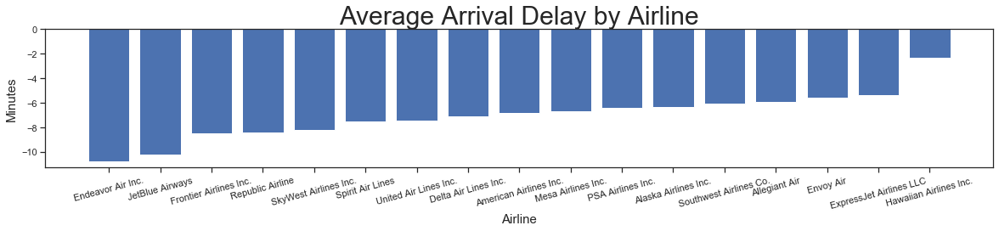

In [21]:
### Bar Graph Of Airlines Sorted By Average Arrival Delay ###

plt.figure(figsize=(20, 3))
plt.xticks(rotation=15)
plt.title('Average Arrival Delay by Airline',fontsize=30)
plt.xlabel('Airline',fontsize=15)
plt.ylabel('Minutes',fontsize=15)
plt.bar(grouped_and_sorted_by_airline_df['ARR_DELAY'].index, grouped_and_sorted_by_airline_df['ARR_DELAY'].values)
#plt.savefig('images/Average_Arrival_Delay_by_Airline.png')

<BarContainer object of 359 artists>

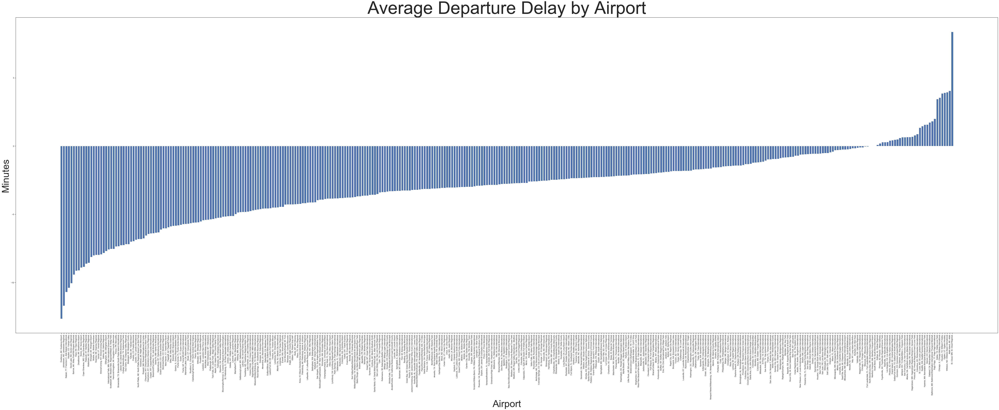

In [23]:
### Bar Graph Of Airports Sorted By Departure Delay ###

plt.figure(figsize=(100, 33))
plt.xticks(rotation=90)
plt.title('Average Departure Delay by Airport',fontsize=100)
plt.xlabel('Airport',fontsize=55)
plt.ylabel('Minutes',fontsize=55)
plt.bar(grouped_and_sorted_by_airport_df['DEP_DELAY'].index, grouped_and_sorted_by_airport_df['DEP_DELAY'].values)
#plt.savefig('images/Average_Departure_Delay_by_Airport.png')

<BarContainer object of 30 artists>

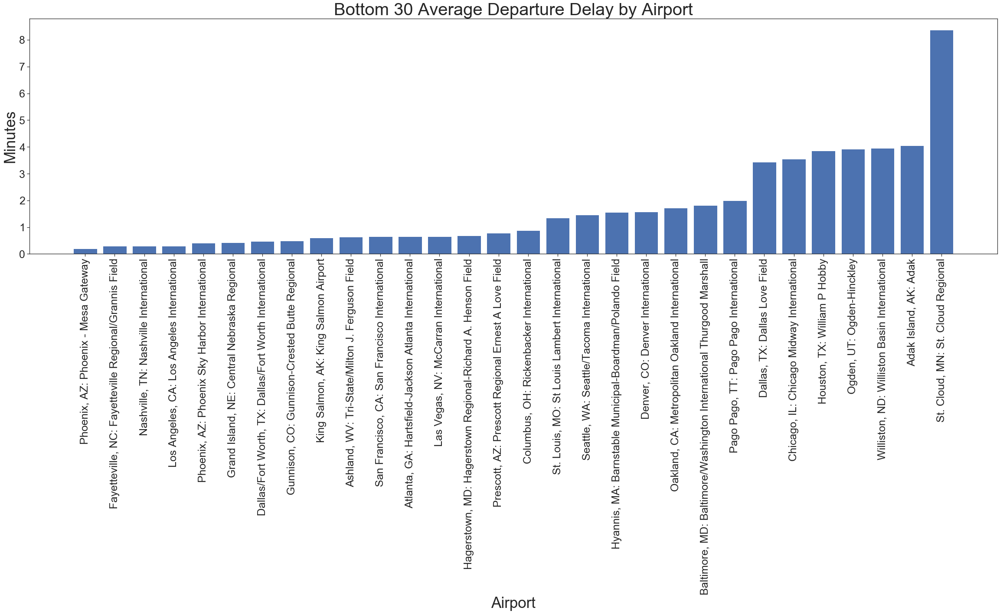

In [25]:
### Bottom 30 Average Departure Delay by Airport ###

plt.figure(figsize=(40, 10))
plt.xticks(rotation=90)
plt.title('Bottom 30 Average Departure Delay by Airport',fontsize=40)
plt.xlabel('Airport',fontsize=35)
plt.ylabel('Minutes',fontsize=35)
plt.tick_params(labelsize=25)
plt.bar(grouped_and_sorted_by_airport_df.tail(30)['DEP_DELAY'].index, grouped_and_sorted_by_airport_df.tail(30)['DEP_DELAY'].values)
#plt.savefig('images/Bottom_30_Average_Departure_Delay_by_Airport.png')

<BarContainer object of 30 artists>

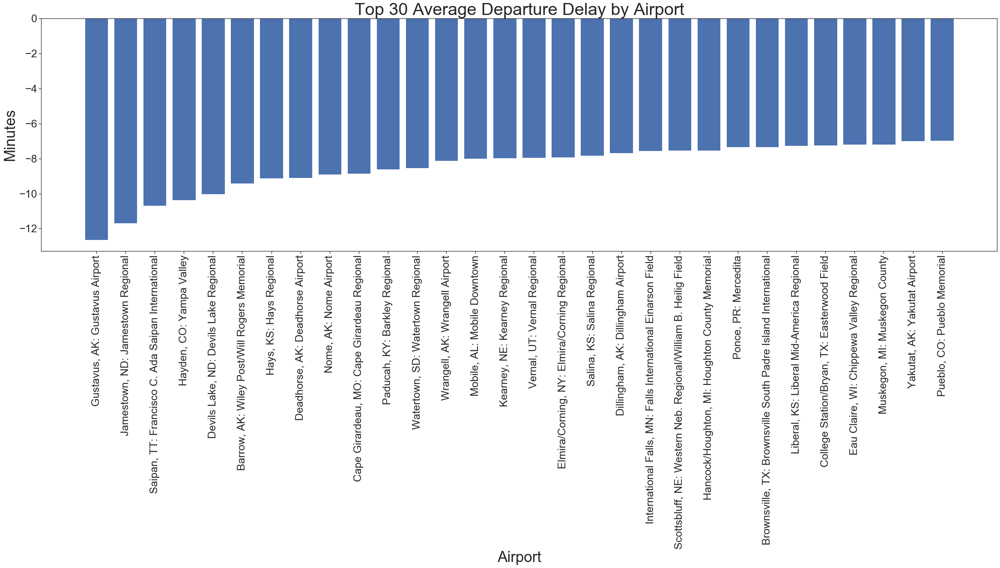

In [26]:
### Top 30 Average Departure Delay by Airport ###

plt.figure(figsize=(40, 10))
plt.xticks(rotation=90)
plt.title('Top 30 Average Departure Delay by Airport',fontsize=40)
plt.xlabel('Airport',fontsize=35)
plt.ylabel('Minutes',fontsize=35)
plt.tick_params(labelsize=25)
plt.bar(grouped_and_sorted_by_airport_df.head(30)['DEP_DELAY'].index, grouped_and_sorted_by_airport_df.head(30)['DEP_DELAY'].values)
#plt.savefig('images/Top_30_Average_Departure_Delay_by_Airport.png')

<BarContainer object of 7 artists>

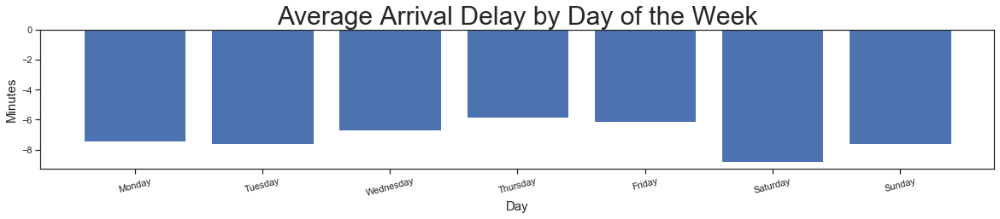

In [27]:
### Bar Graph Of Days of the Week Sorted By Average Arrival Delay ###

plt.figure(figsize=(20, 3))
plt.xticks(rotation=15)
plt.title('Average Arrival Delay by Day of the Week',fontsize=30)
plt.xlabel('Day',fontsize=15)
plt.ylabel('Minutes',fontsize=15)
plt.bar(grouped_and_sorted_by_day_df['ARR_DELAY'].index, grouped_and_sorted_by_day_df['ARR_DELAY'].values)
#plt.savefig('images/Average_Arrival_Delay_by_Day.png')

In [28]:
### Function to return the departure averages of the airlines of the given airport ###

def airline_mean_dep_ratings(airport):
    """Returns the departure averages given an airport as input

    Parameters
    ----------
    airport : str
        The airport can be the airport code or the full name of the airport, but it must be exact. 

    Returns
    -------
    pandas series of the departure averages of each airline that flys out of that airport
    """
    if airport in merged_df['ORIGIN_CODE'].unique() or airport in merged_df['ORIGIN_NAME'].unique():
        if len(airport) == 3:
            return merged_df.groupby(['ORIGIN_CODE','AIRLINE']).mean().loc[airport]['DEP_DELAY']
        return merged_df.groupby(['ORIGIN_NAME','AIRLINE']).mean().loc[airport]['DEP_DELAY']
    return "Not a valid entry, please use the 3-character airport code or the exact name. The list of valid airport names can be found here: https://transtats.bts.gov/DL_SelectFields.asp?Table_ID=236&DB_Short_Name=On-Time"
    
    #another way to write it:
    #airline_delay_for_airport_x(airport):
    #origin_code_df = merged_df[merged_df['ORIGIN_CODE']==airport]
    #return origin_code_df.groupby('AIRLINE').mean()['DEP_DELAY']

airline_mean_dep_ratings('JFK')

AIRLINE
Alaska Airlines Inc.     -2.311504
American Airlines Inc.   -1.137007
Delta Air Lines Inc.      1.024130
Endeavor Air Inc.        -1.639218
Envoy Air                -3.989011
Hawaiian Airlines Inc.   -1.235294
JetBlue Airways          -0.467426
Republic Airline         -2.922170
SkyWest Airlines Inc.     1.623987
Name: DEP_DELAY, dtype: float64

<BarContainer object of 359 artists>

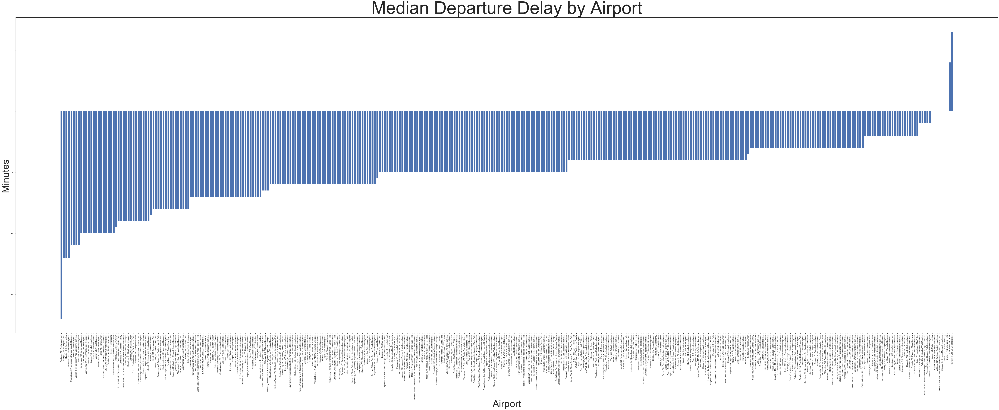

In [29]:
### Median Departure Delay by Airport ###

plt.figure(figsize=(100, 33))
plt.xticks(rotation=90)
plt.title('Median Departure Delay by Airport',fontsize=100)
plt.xlabel('Airport',fontsize=55)
plt.ylabel('Minutes',fontsize=55)
plt.bar(merged_df.groupby('ORIGIN_NAME').median().sort_values(by=['DEP_DELAY'])['DEP_DELAY'].index, merged_df.groupby('ORIGIN_NAME').median().sort_values(by=['DEP_DELAY'])['DEP_DELAY'].values)
#plt.savefig('images/Median_Departure_Delay_by_Airport.png')

In [30]:
### Function to get rows of a specific airline ##

def df_by_airline(airline_name):
    return merged_df[merged_df['AIRLINE']==airline_name]
#df_by_airline('Southwest Airlines Co.')


In [31]:
### Function to get rows of a specific origin airport ###

def df_by_origin_airport(airport_name):
    return merged_df[merged_df['ORIGIN_CODE']==airport_name]
#df_by_origin_airport('MCI')




In [32]:
def clean_DEP_DELAY_df_by_origin_airport(airport_name):
    return clean_DEP_DELY_df[clean_DEP_DELY_df['ORIGIN_CODE']==airport_name]
#df_by_origin_airport('MCI')

def clean_DEP_DELAY_df_by_airline(airline_name):
    return clean_DEP_DELY_df[clean_DEP_DELY_df['AIRLINE']==airline_name]
#df_by_airline('Southwest Airlines Co.')

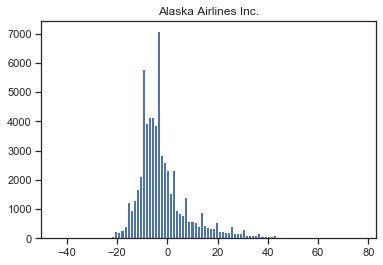

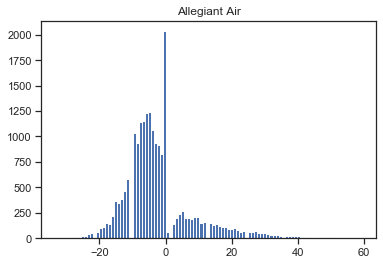

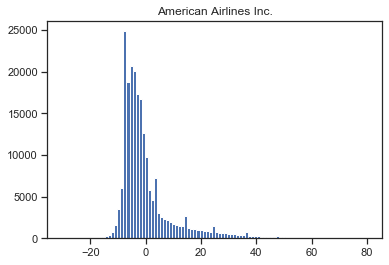

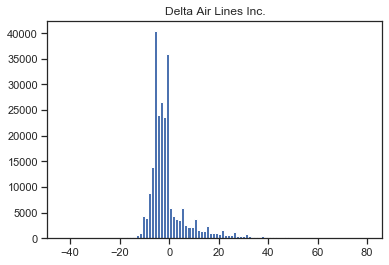

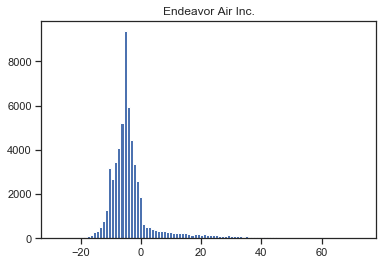

...

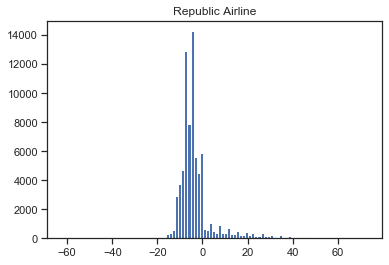

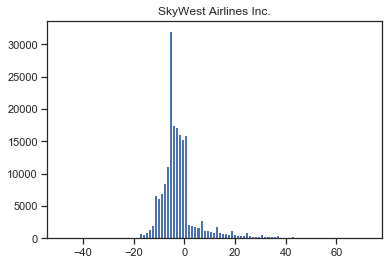

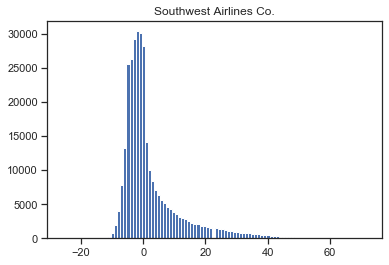

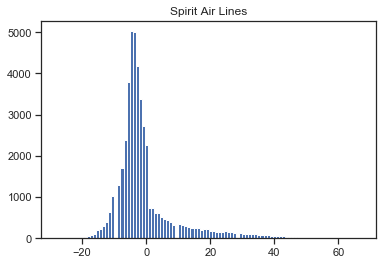

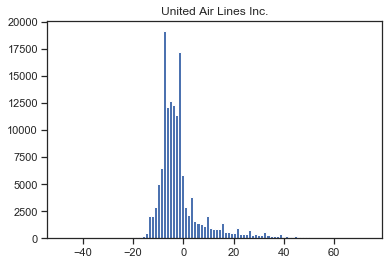

In [35]:
### Histograms of each airline's departure delays ###

for airline in airline_list:
    fig = plt.figure()
    plt.title(airline)
    plt.hist(df_by_airline(airline)['DEP_DELAY'],bins=100)

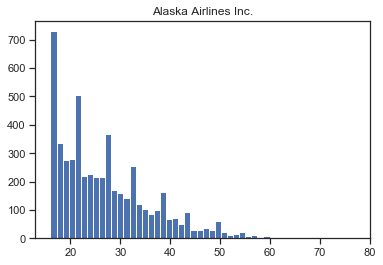

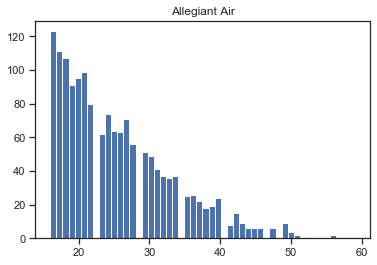

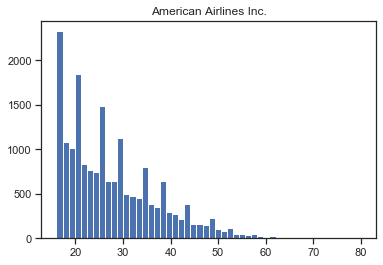

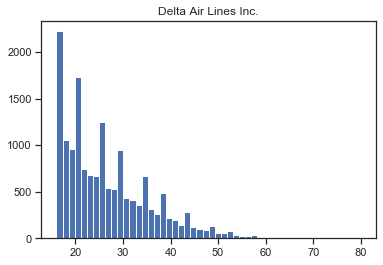

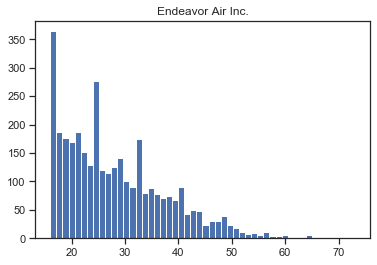

...

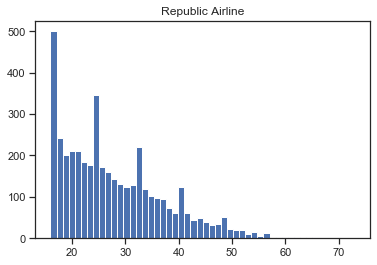

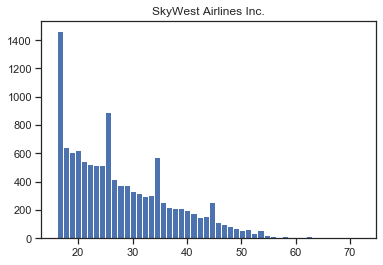

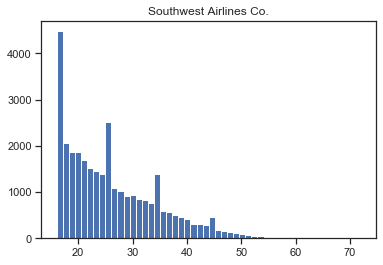

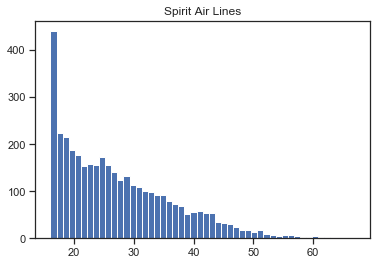

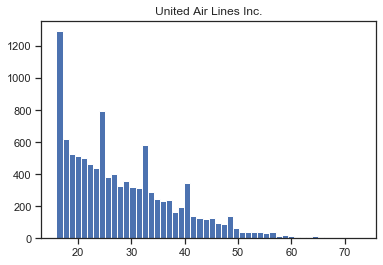

In [36]:
### Histograms of each airline's departure delays more than 15 minutes

for airline in airline_list:
    fig = plt.figure()
    plt.title(airline)
    plt.hist(merged_df[(merged_df['AIRLINE']==airline)&(merged_df['DEP_DELAY']>15)]['DEP_DELAY'],bins=50)
    
    

In [37]:
### Creating table and bar graph of % of flights that are 15+ minutes delayed grouped by Origin_Code ###

percet_15_min_delayed_by_origin_code = (merged_df[(merged_df['DEP_DELAY']>14)].groupby('ORIGIN_CODE').count()['DEP_DELAY'] / merged_df.groupby('ORIGIN_CODE').count()['DEP_DELAY']).sort_values()
percet_15_min_delayed_by_origin_code

### Bar graph of % of flights that are 15+ minutes delayed by Airport ###
#TOO MEMORY INTENSIVE TO RUN ALL AIRPORTS, NEED DF WITH TOP 20 AIRPORTS
# for airport in airport_code_list:
    
#     plt.figure(figsize=(20, 3))
#     plt.xticks(rotation=15)
#     plt.title(f"Percentage of {airport}'s flight departures 15+ minutes delayed by Airport",fontsize=30)
#     plt.xlabel('Airport',fontsize=15)
#     plt.ylabel('Percent',fontsize=15)
#     plt.bar(percet_15_min_delayed_by_origin_code.index, percet_15_min_delayed_by_origin_code.values)
#     #plt.savefig('images/Percent_of_15+_Minute_Arrival_Delay_by_Airport.png')

ORIGIN_CODE
BRD    0.006410
HIB    0.006623
CPR    0.007168
LBF    0.007463
LWS    0.011070
         ...   
OGD    0.208333
STC    0.500000
AKN         NaN
ELM         NaN
OWB         NaN
Name: DEP_DELAY, Length: 359, dtype: float64

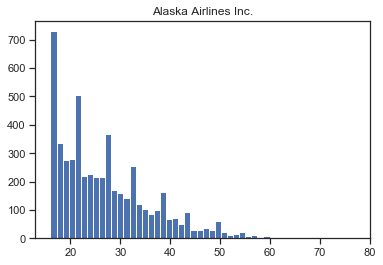

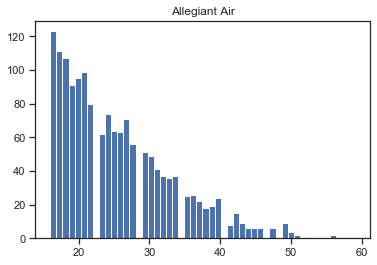

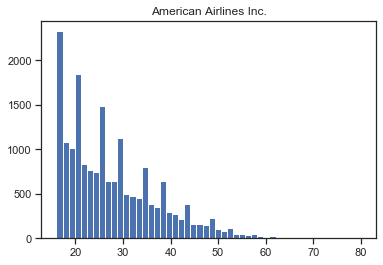

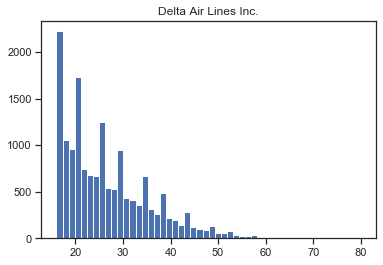

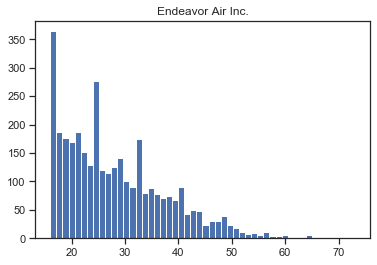

...

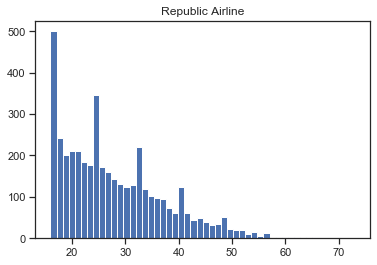

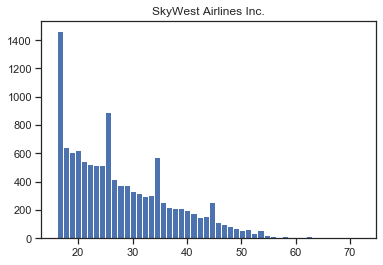

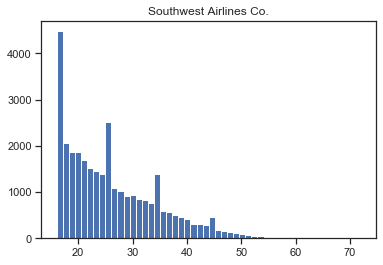

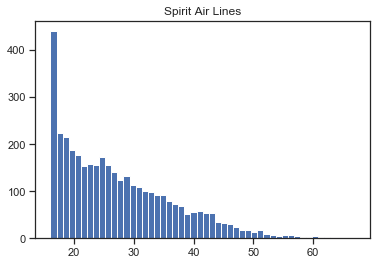

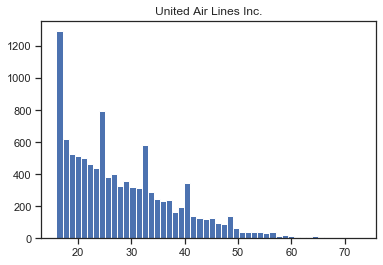

In [38]:
### Bar graph of % of flights that are 15+ minutes delayed by Airline ###

for airline in airline_list:
    fig = plt.figure()
    plt.title(airline)
    plt.hist(merged_df[(merged_df['AIRLINE']==airline)&(merged_df['DEP_DELAY']>15)]['DEP_DELAY'],bins=50)


<BarContainer object of 17 artists>

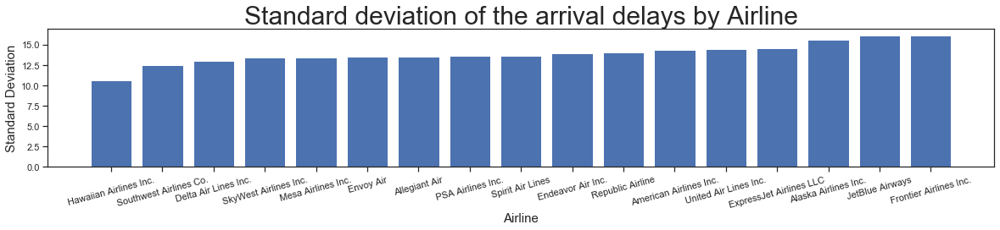

In [39]:
### Creating table of the standard deviation of the arrival delays ###

std_airline_delays_df = merged_df.groupby('AIRLINE').std().sort_values(by=['ARR_DELAY'])['ARR_DELAY']

### Bar graph of the standard deviation of the arrival delays ###

plt.figure(figsize=(20, 3))
plt.xticks(rotation=15)
plt.title('Standard deviation of the arrival delays by Airline',fontsize=30)
plt.xlabel('Airline',fontsize=15)
plt.ylabel('Standard Deviation',fontsize=15)
plt.bar(std_airline_delays_df.index, std_airline_delays_df.values)
#plt.savefig('images/Standard_Deviation_Arrival_Delay_by_Airline.png')

/Users/Justin_Turner/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


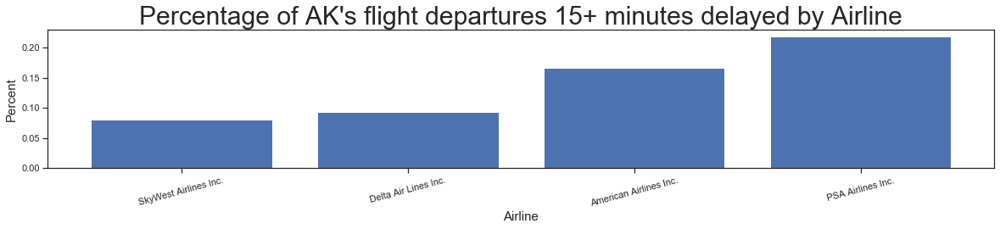

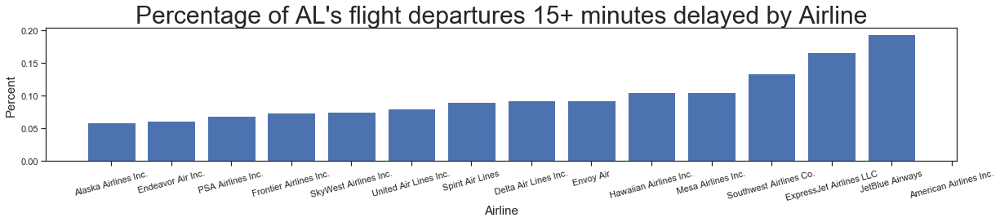

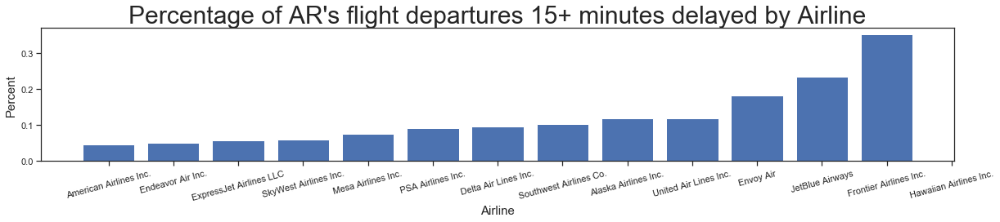

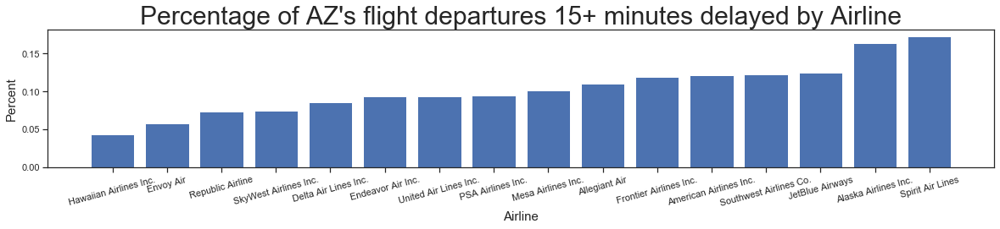

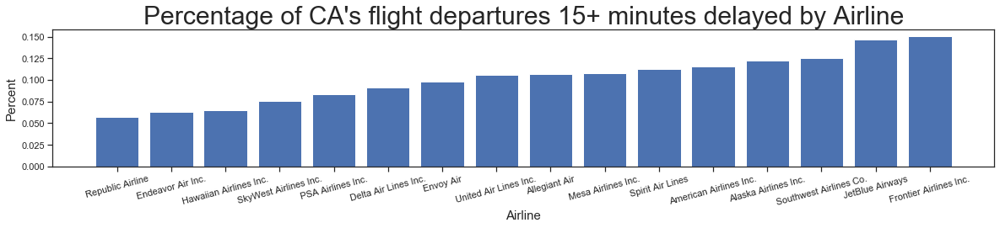

...

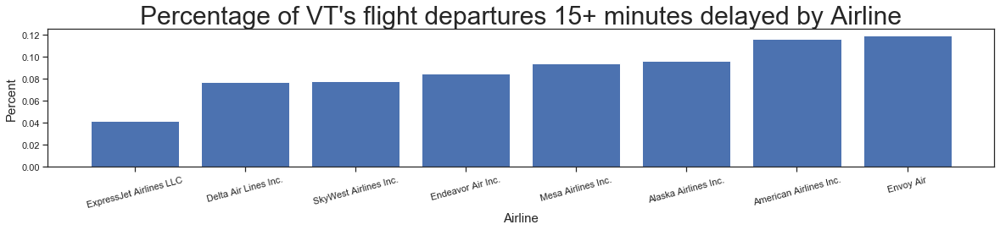

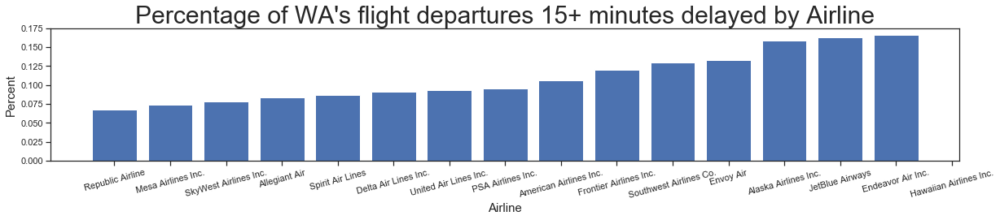

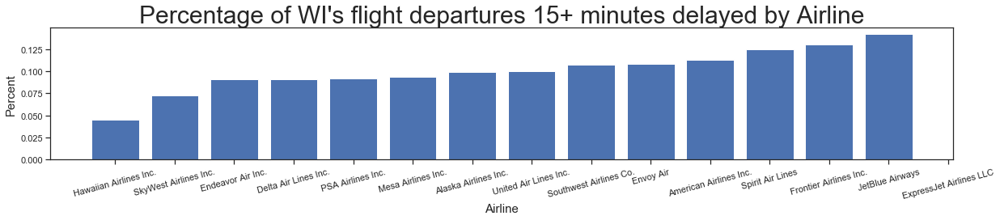

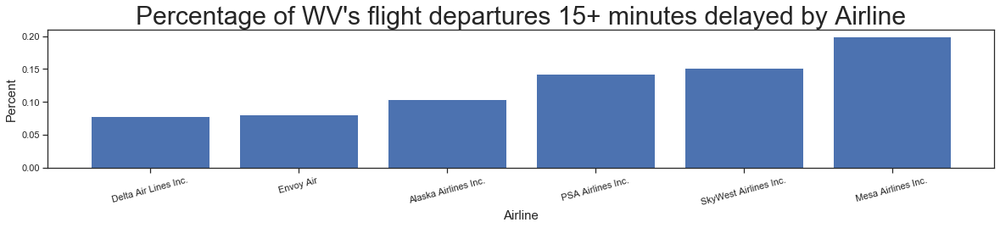

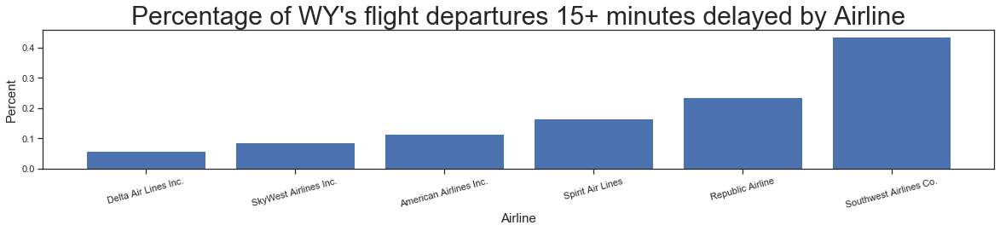

In [40]:
### Creating table and bar graph of % of flights that are 15+ minutes delayed grouped by OriginStateName ###

def dep_15_of_airlines_by_state_x(state,):
    percet_15_min_delayed_by_origin_state_code = (merged_df[(merged_df['DEP_DELAY']>14)&(merged_df['ORIGIN_STATE']==state)].groupby('AIRLINE').count()['DEP_DELAY']/merged_df[(merged_df['ORIGIN_STATE']==state)].groupby('AIRLINE').count()['DEP_DELAY'])
    return percet_15_min_delayed_by_origin_state_code.sort_values()


## Bar graph of % of flights that are 15+ minutes delayed by State ###

for state in origin_state_code_list:
    
    plt.figure(figsize=(20, 3))
    plt.xticks(rotation=15)
    plt.title(f"Percentage of {state}'s flight departures 15+ minutes delayed by Airline",fontsize=30)
    plt.xlabel('Airline',fontsize=15)
    plt.ylabel('Percent',fontsize=15)
    plt.bar(dep_15_of_airlines_by_state_x(state).index, dep_15_of_airlines_by_state_x(state).values)
    #plt.savefig('images/Percent_of_15+_Minute_Arrival_Delay_by_Airport.png')

/Users/Justin_Turner/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


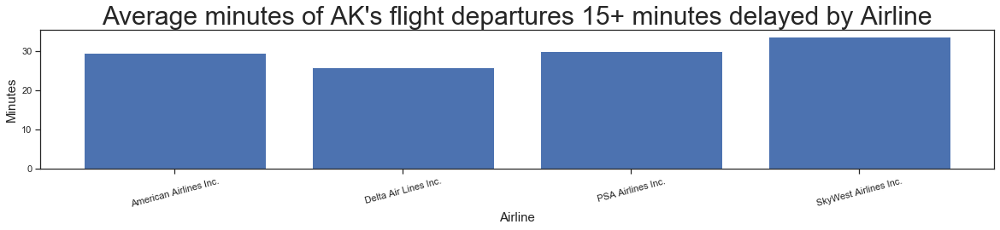

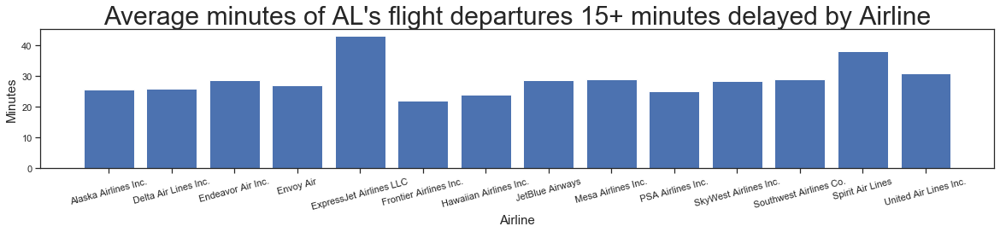

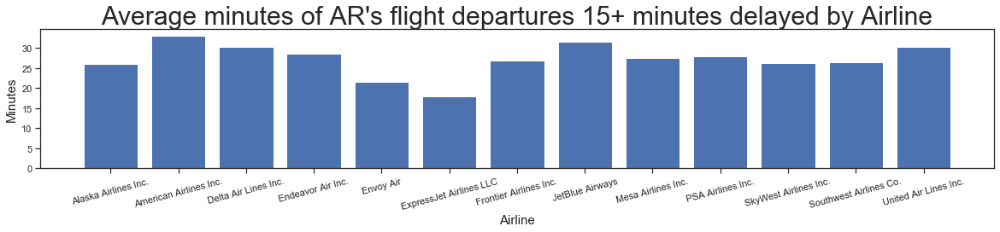

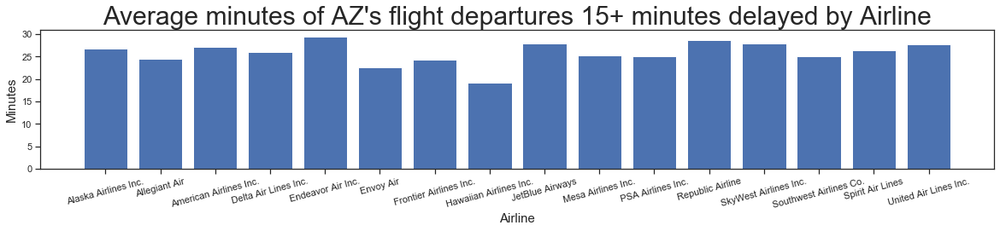

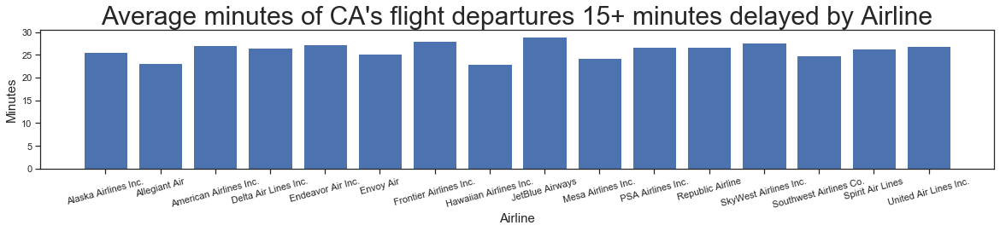

...

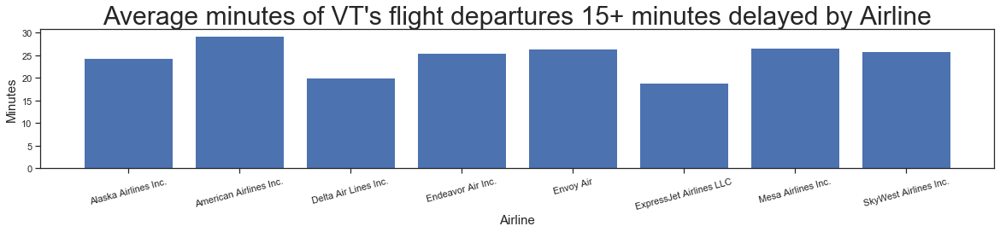

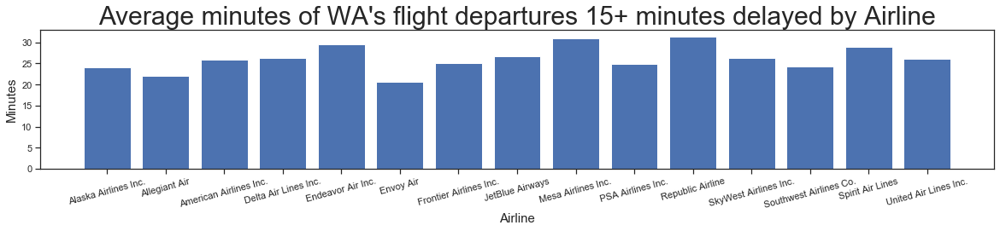

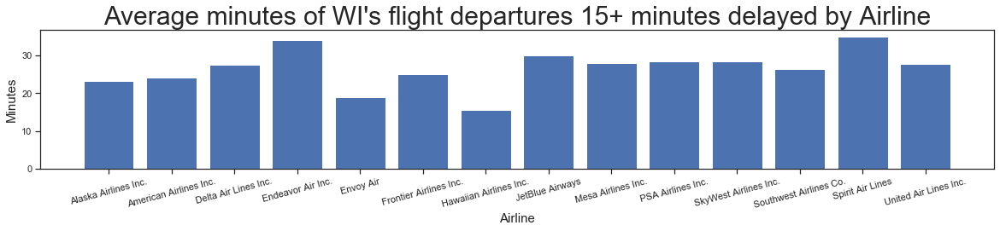

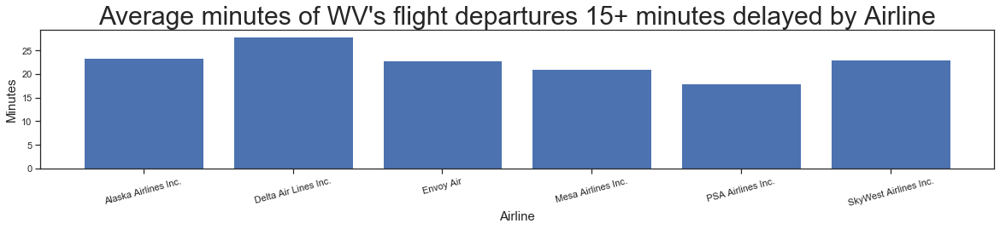

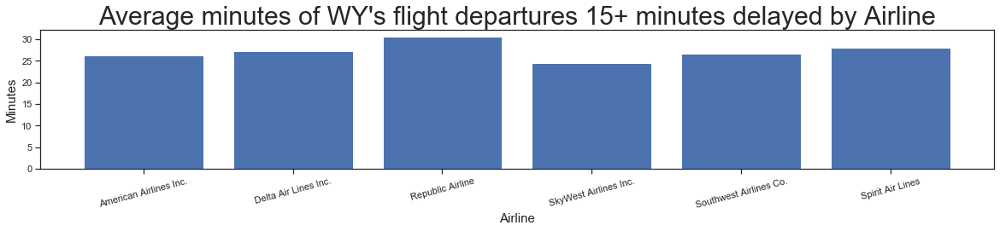

In [41]:
for state in origin_state_code_list:
    
    plt.figure(figsize=(20, 3))
    plt.xticks(rotation=15)
    plt.title(f"Average minutes of {state}'s flight departures 15+ minutes delayed by Airline",fontsize=30)
    plt.xlabel('Airline',fontsize=15)
    plt.ylabel('Minutes',fontsize=15)
    plt.bar(merged_df[(merged_df['DEP_DELAY']>14)&(merged_df['ORIGIN_STATE']==state)].groupby('AIRLINE').mean()['DEP_DELAY'].index, merged_df[(merged_df['DEP_DELAY']>14)&(merged_df['ORIGIN_STATE']==state)].groupby('AIRLINE').mean()['DEP_DELAY'].values)
    #plt.savefig('images/Percent_of_15+_Minute_Arrival_Delay_by_Airport.png')

/Users/Justin_Turner/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


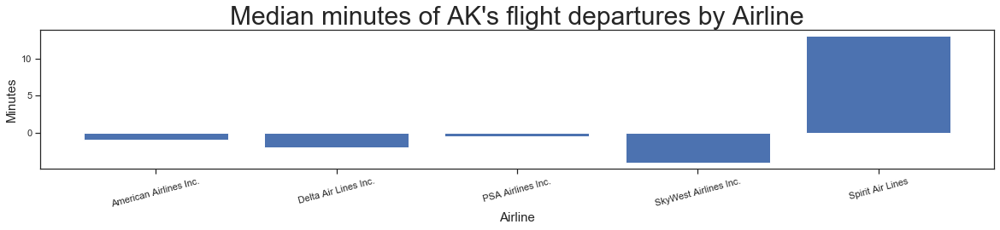

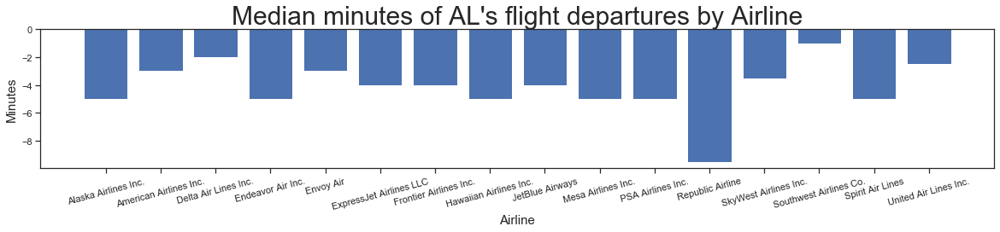

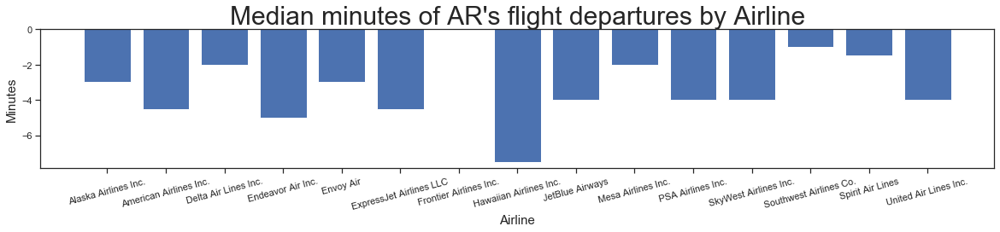

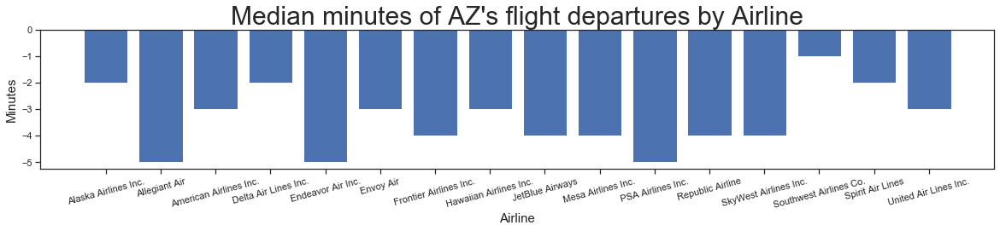

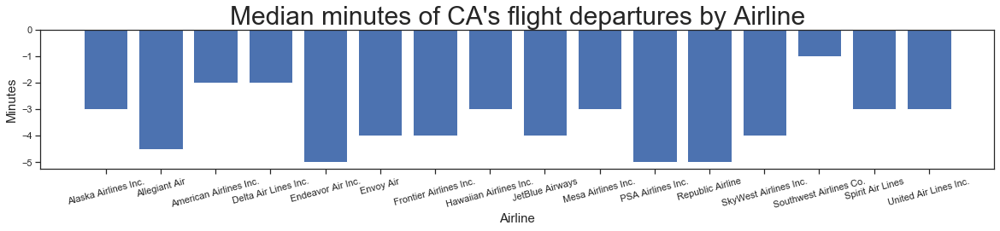

...

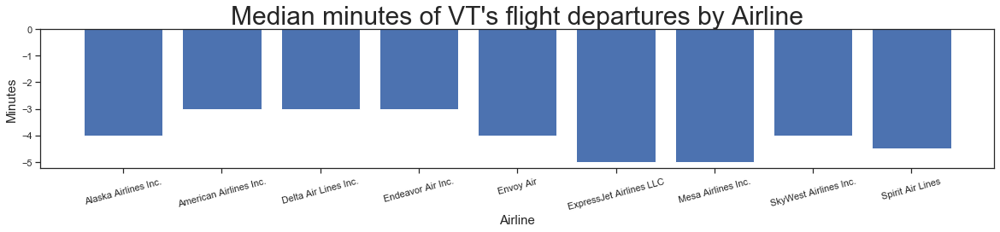

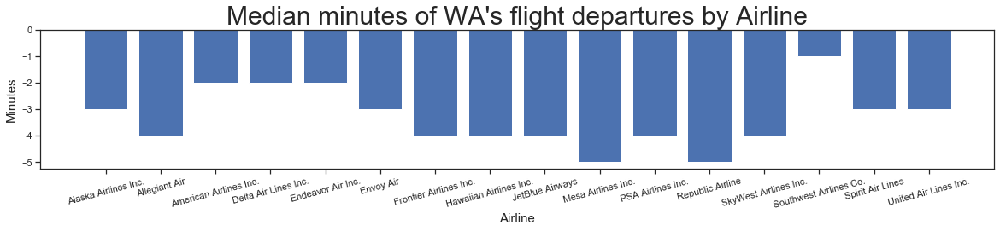

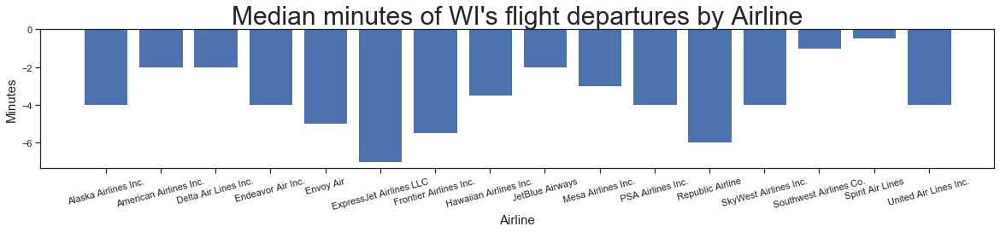

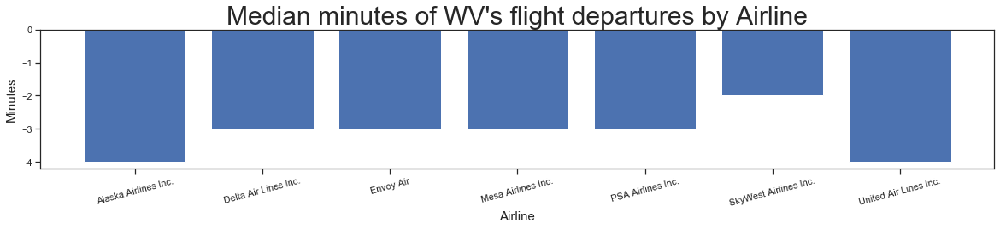

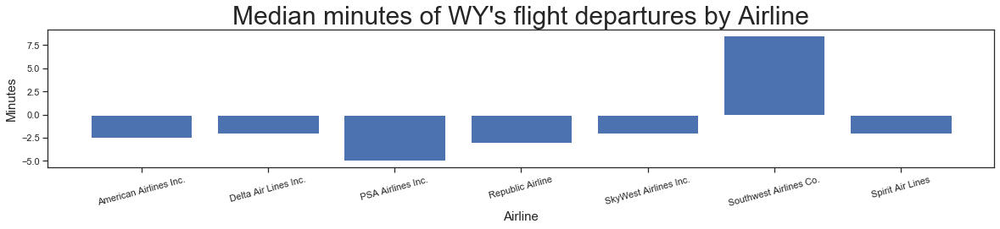

In [42]:
for state in origin_state_code_list:
    
    plt.figure(figsize=(20, 3))
    plt.xticks(rotation=15)
    plt.title(f"Median minutes of {state}'s flight departures by Airline",fontsize=30)
    plt.xlabel('Airline',fontsize=15)
    plt.ylabel('Minutes',fontsize=15)
    plt.bar(merged_df[(merged_df['ORIGIN_STATE']==state)].groupby('AIRLINE').median()['DEP_DELAY'].index, merged_df[(merged_df['ORIGIN_STATE']==state)].groupby('AIRLINE').median()['DEP_DELAY'].values)
    #plt.savefig('images/Percent_of_15+_Minute_Arrival_Delay_by_Airport.png')

Text(0.5, 1.0, 'Side-by-Side Histogram with Multiple Airlines')

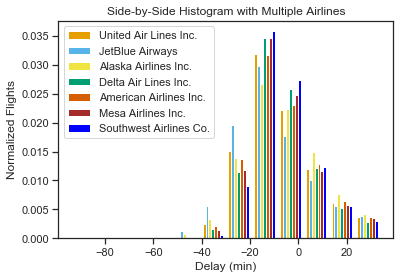

In [57]:
# Make a separate list for each airline
x1 = list(clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE'] == 'United Air Lines Inc.']['ARR_DELAY'])
x2 = list(clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE'] == 'JetBlue Airways']['ARR_DELAY'])
x3 = list(clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE'] == 'Alaska Airlines Inc.']['ARR_DELAY'])
x4 = list(clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE'] == 'Delta Air Lines Inc.']['ARR_DELAY'])
x5 = list(clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE'] == 'American Airlines Inc.']['ARR_DELAY'])
x6 = list(clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE'] == 'Mesa Airlines Inc.']['ARR_DELAY'])
x7 = list(clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE'] == 'Southwest Airlines Co.']['ARR_DELAY'])

# Assign colors for each airline and the names
colors = ['#E69F00', '#56B4E9', '#F0E442', '#009E73', '#D55E00', 'brown', 'blue']
names = ['United Air Lines Inc.', 'JetBlue Airways', 'Alaska Airlines Inc.',
         'Delta Air Lines Inc.', 'American Airlines Inc.','Mesa Airlines Inc.','Southwest Airlines Co.']
         
# Make the histogram using a list of lists
# Normalize the flights and assign colors and names
plt.hist([x1, x2, x3, x4, x5, x6, x7], bins = int(180/15), density=True,
         color = colors, label=names)

# Plot formatting
plt.legend()
plt.xlabel('Delay (min)')
plt.ylabel('Normalized Flights')
plt.title('Side-by-Side Histogram with Multiple Airlines')

Text(0, 0.5, 'Density')

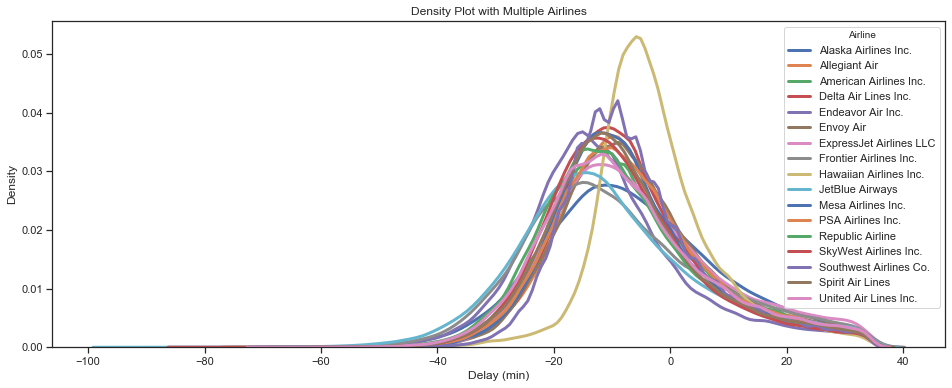

In [46]:
# Iterate through the airlines
plt.figure(figsize=(16, 6))
for airline in airline_list:
    # Subset to the airline
    subset = clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE'] == airline]
    
    # Draw the density plot
    sns.distplot(subset['ARR_DELAY'], hist = False, kde = True,
                 kde_kws = {'linewidth': 3},
                 label = airline)
    
    
# Plot formatting
plt.legend(title = 'Airline',loc = 'upper right')
plt.title('Density Plot with Multiple Airlines')
plt.xlabel('Delay (min)')
plt.ylabel('Density')

In [48]:
### Functions for upcoming graphs ### 

def arrivals_of_airline_x(airline):
    return clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE']==airline]['ARR_DELAY']

def departures_of_state_x(state):
    return clean_ARR_DELY_df[clean_ARR_DELY_df['ORIGIN_STATE_NAME']==airline]['DEP_DELAY']

def all_arrivals_but_x__by_airline_df(airline):
    return clean_ARR_DELY_df[clean_ARR_DELY_df['AIRLINE']!=airline]['ARR_DELAY']

def all_departures_but_x_by_state_df(state):
    return clean_ARR_DELY_df[clean_ARR_DELY_df['ORIGIN_STATE_NAME']!=state]['DEP_DELAY']


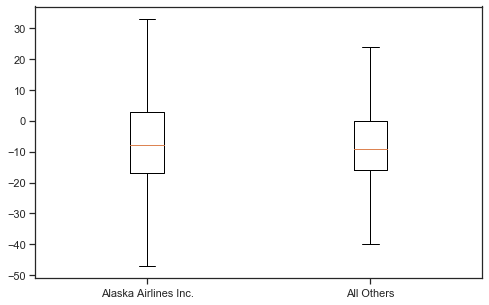

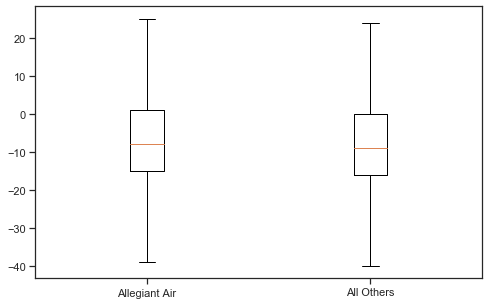

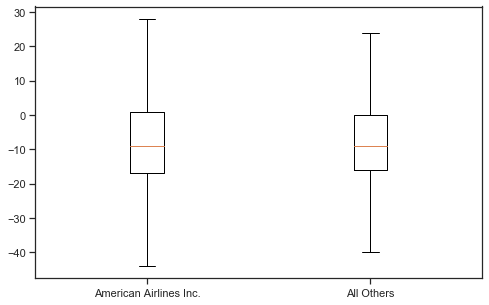

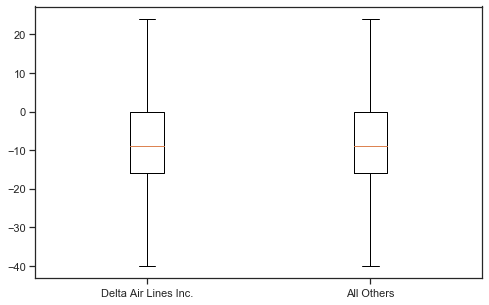

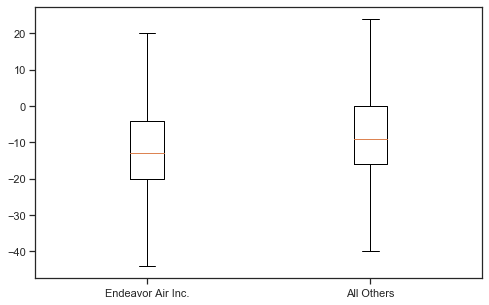

...

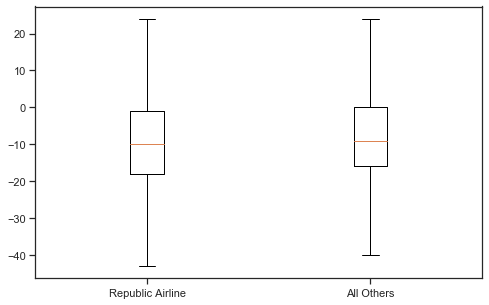

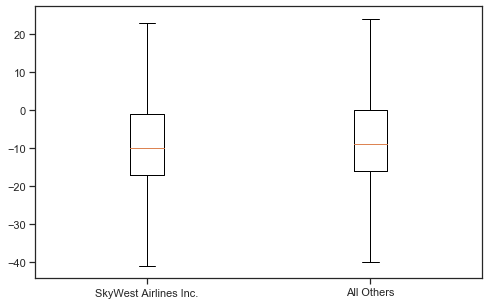

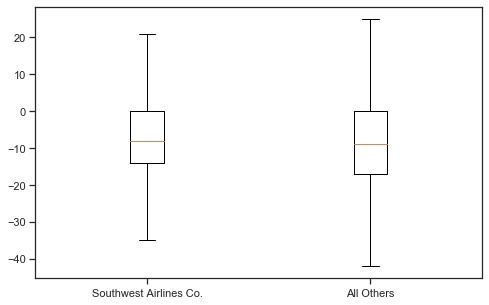

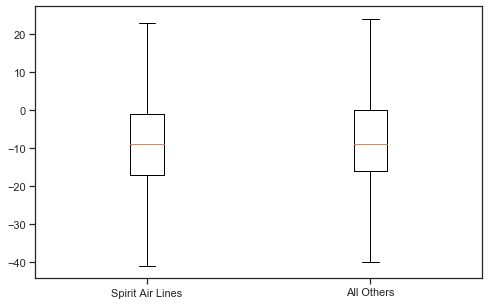

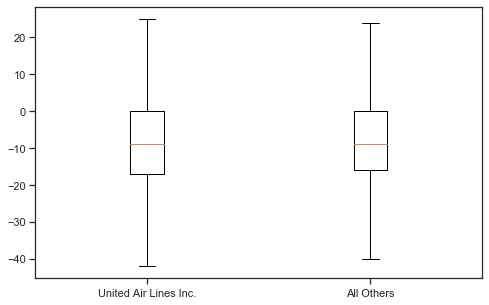

In [49]:
### Boxplots of each airline caompared to the average of all of the others ###

for airline in airline_list:
    fig, ax = plt.subplots(1, figsize=(8, 5))
    ax.boxplot([arrivals_of_airline_x(airline), all_arrivals_but_x__by_airline_df(airline)],showfliers = False)
    ax.set_xticks([1,2])
    ax.set_xticklabels([airline, "All Others"])



In [51]:
### Function to run Welch T test ###

def welch_test_statistic(sample_1, sample_2):
    numerator = np.mean(sample_1) - np.mean(sample_2)
    denominator_sq = (np.var(sample_1) / len(sample_1)) + (np.var(sample_2) / len(sample_2))
    return numerator / np.sqrt(denominator_sq)

In [54]:
### Mann Whitney U test for each airline compared to the average of all others ###

for airline in airline_list:
    res = stats.mannwhitneyu(all_arrivals_but_x__by_airline_df(airline), arrivals_of_airline_x(airline), alternative="less")
    print(f"U-Test p-value for {airline} >= All others: {round(res.pvalue,3)}")
    print(res,2)
    print("")
    
#1=cannot rejsec the null hypothesis
#0=can reject the null hypothesis

U-Test p-value for Alaska Airlines Inc. >= All others: 0.0
MannwhitneyuResult(statistic=48713956482.0, pvalue=2.5510754112823256e-54) 2

U-Test p-value for Allegiant Air >= All others: 0.0
MannwhitneyuResult(statistic=15577585963.5, pvalue=4.810199464181208e-44) 2

U-Test p-value for American Airlines Inc. >= All others: 0.0
MannwhitneyuResult(statistic=154076122322.0, pvalue=1.9458307370883086e-11) 2

U-Test p-value for Delta Air Lines Inc. >= All others: 0.0
MannwhitneyuResult(statistic=171735828439.5, pvalue=1.1160198617335025e-19) 2

U-Test p-value for Endeavor Air Inc. >= All others: 1.0
MannwhitneyuResult(statistic=55846863036.0, pvalue=1.0) 2

U-Test p-value for Envoy Air >= All others: 0.0
MannwhitneyuResult(statistic=55233238510.0, pvalue=3.0406051660935313e-242) 2

U-Test p-value for ExpressJet Airlines LLC >= All others: 0.0
MannwhitneyuResult(statistic=20623730087.5, pvalue=4.586768571852667e-62) 2

U-Test p-value for Frontier Airlines Inc. >= All others: 1.0
MannwhitneyuRe

In [55]:
### Welch T test for each airline compared to the average of all others ###


for airline in airline_list:
    test_statistic = welch_test_statistic(all_arrivals_but_x__by_airline_df(airline), arrivals_of_airline_x(airline))
    print(f"{airline} Welch Test Statistic: {test_statistic}")
    print("")

Alaska Airlines Inc. Welch Test Statistic: -13.021180815696438

Allegiant Air Welch Test Statistic: -12.480872715699475

American Airlines Inc. Welch Test Statistic: -10.929393126679482

Delta Air Lines Inc. Welch Test Statistic: -1.950707697230672

Endeavor Air Inc. Welch Test Statistic: 64.38604707497615

Envoy Air Welch Test Statistic: -31.840835374644

ExpressJet Airlines LLC Welch Test Statistic: -19.51832505963513

Frontier Airlines Inc. Welch Test Statistic: 15.355747955827525

Hawaiian Airlines Inc. Welch Test Statistic: -65.26375095612073

JetBlue Airways Welch Test Statistic: 49.073367309675724

Mesa Airlines Inc. Welch Test Statistic: -7.102361037910908

PSA Airlines Inc. Welch Test Statistic: -13.273498680999165

Republic Airline Welch Test Statistic: 26.227919078349466

SkyWest Airlines Inc. Welch Test Statistic: 37.60254726263126

Southwest Airlines Co. Welch Test Statistic: -52.93186282378885

Spirit Air Lines Welch Test Statistic: 6.167057606603992

United Air Lines Inc